# Exploratory Data Analysis (EDA) for Cassava dataset

In [1]:
try:
    from google.colab import drive
    drive.mount('/content/drive')
    COLAB_ENV = True
except:
    COLAB_ENV = False

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import json
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cv2

In [3]:
INPUT_FOLDER = os.path.join("/content/drive/MyDrive/" if COLAB_ENV else "/", "kaggle/input", "cassava-leaf-disease-classification")

## Train data info

In [4]:
with open(os.path.join(INPUT_FOLDER, "label_num_to_disease_map.json")) as f:
    disease_map = json.load(f)

disease_map = {int(key): value for key, value in disease_map.items()}

print(json.dumps(disease_map, indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


In [5]:
train_data = pd.read_csv(os.path.join(INPUT_FOLDER, "train.csv"))

train_data["class_name"] = train_data["label"].map(disease_map)

train_data.head()

,image_id,label,class_name
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


Number of train examples: 21397
class_name
Cassava Bacterial Blight (CBB)          1087
Cassava Brown Streak Disease (CBSD)     2189
Cassava Green Mottle (CGM)              2386
Cassava Mosaic Disease (CMD)           13158
Healthy                                 2577
Name: image_id, dtype: int64


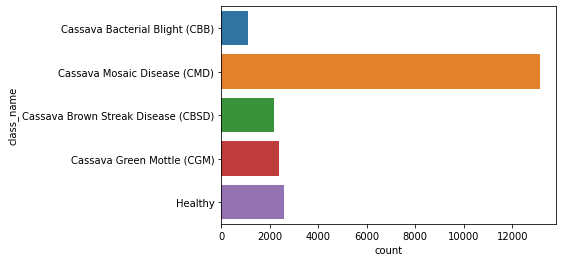

In [6]:
print(f"Number of train examples: {len(train_data)}")
print(train_data.groupby("class_name").image_id.nunique())

sns.countplot(y="class_name", data=train_data)

## Visualization of images

In [7]:
sizes = []
for image_name in train_data.image_id.sample(100):
    img = cv2.imread(os.path.join(INPUT_FOLDER, "train_images", image_name))
    sizes.append(img.shape)

from collections import Counter
print(Counter(sizes))

Counter({(600, 800, 3): 100})


In [8]:
def visualize_batch(image_id, class_name, **kwargs):
    fig, axs = plt.subplots(3, 3, figsize=(18, 15))
    axs = axs.reshape(-1)

    for ind, (image_file, class_n) in enumerate(zip(image_id, class_name)):
        image = cv2.imread(os.path.join(INPUT_FOLDER, "train_images", image_file))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axs[ind].imshow(image)
        axs[ind].set_title(class_n)
        axs[ind].axis("off")

    fig.show()

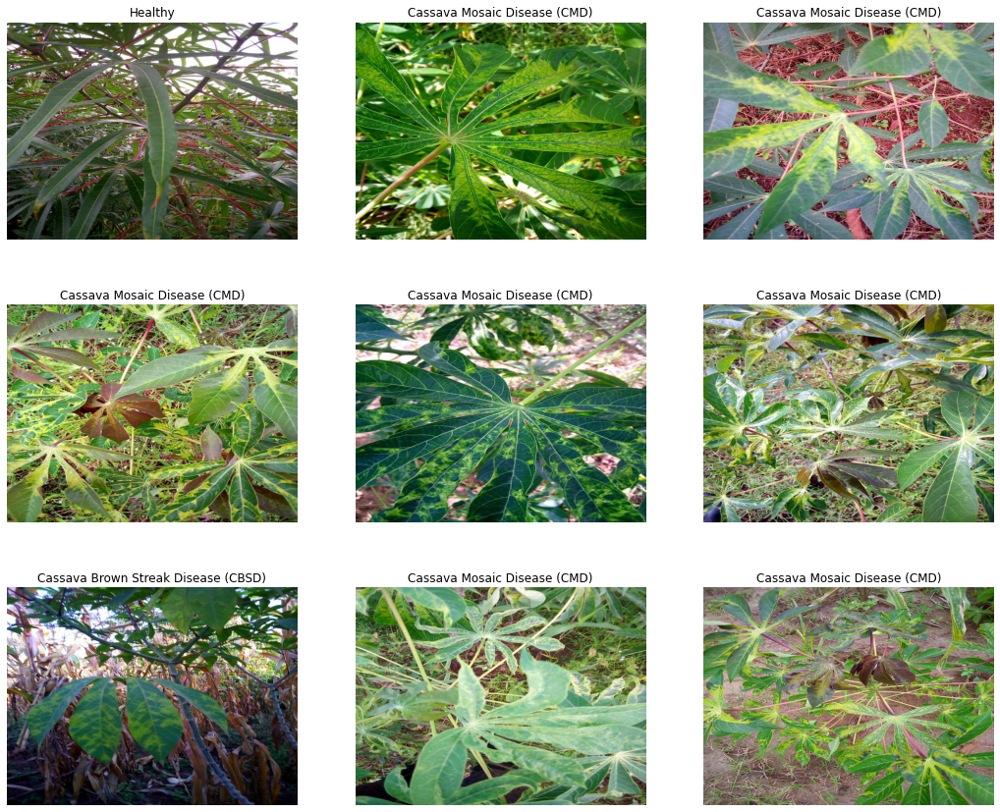

In [9]:
visualize_batch(**train_data.sample(9))

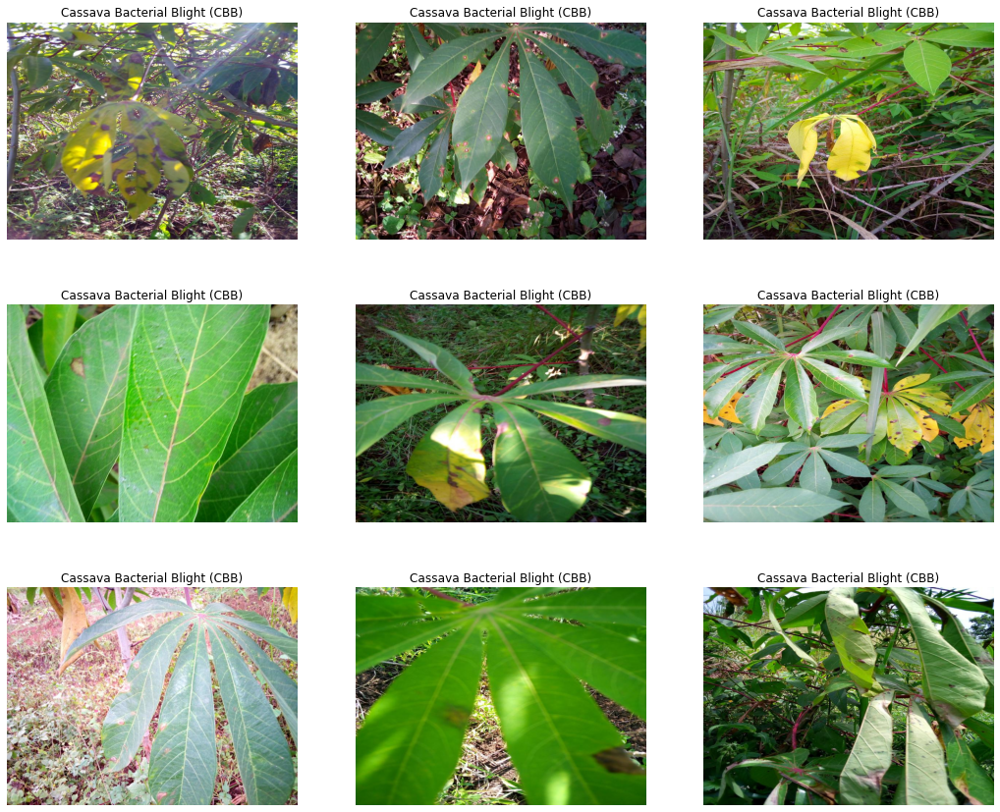

In [10]:
visualize_batch(**train_data[train_data["label"] == 0].sample(9))

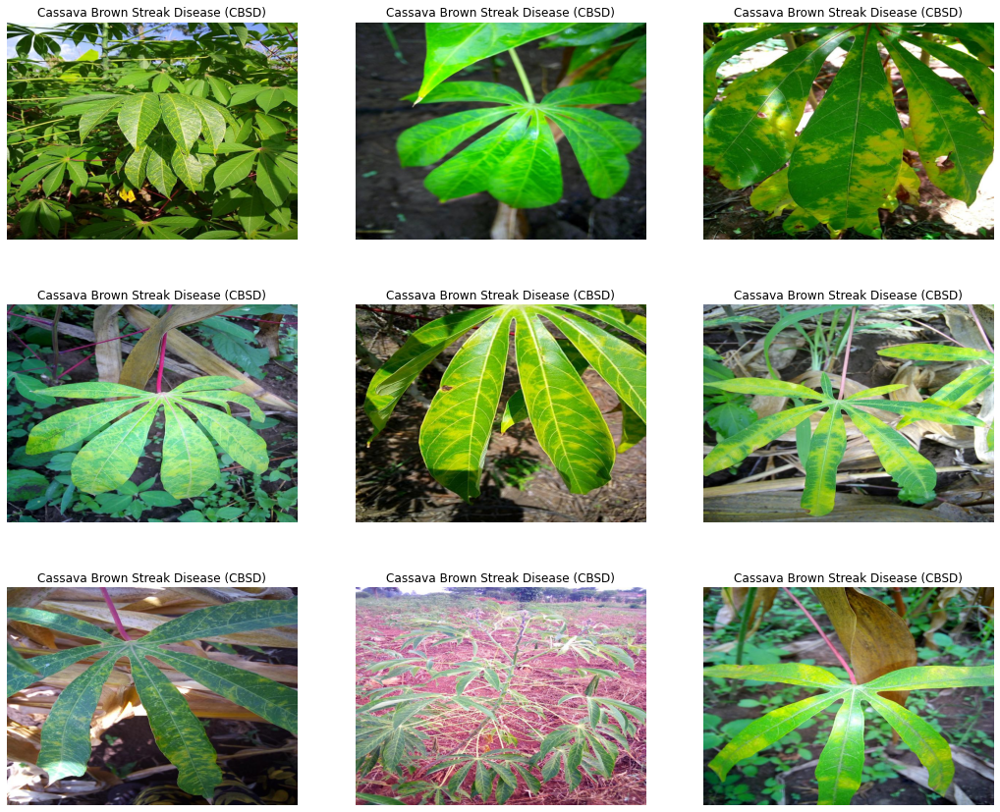

In [11]:
visualize_batch(**train_data[train_data["label"] == 1].sample(9))

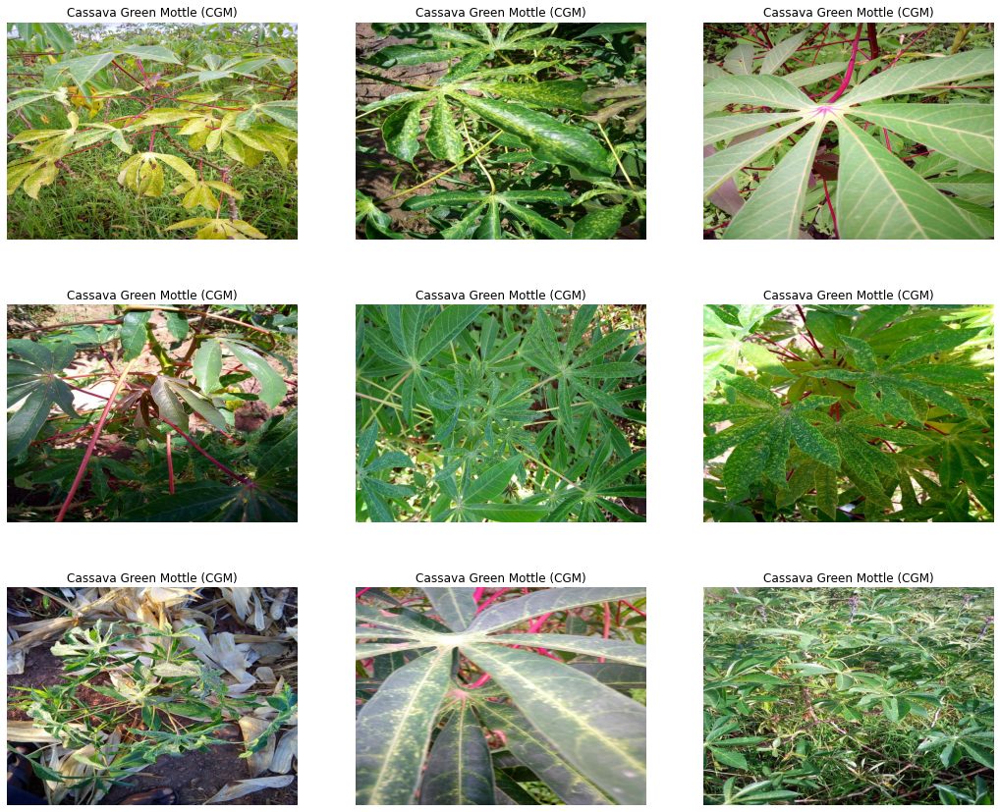

In [12]:
visualize_batch(**train_data[train_data["label"] == 2].sample(9))

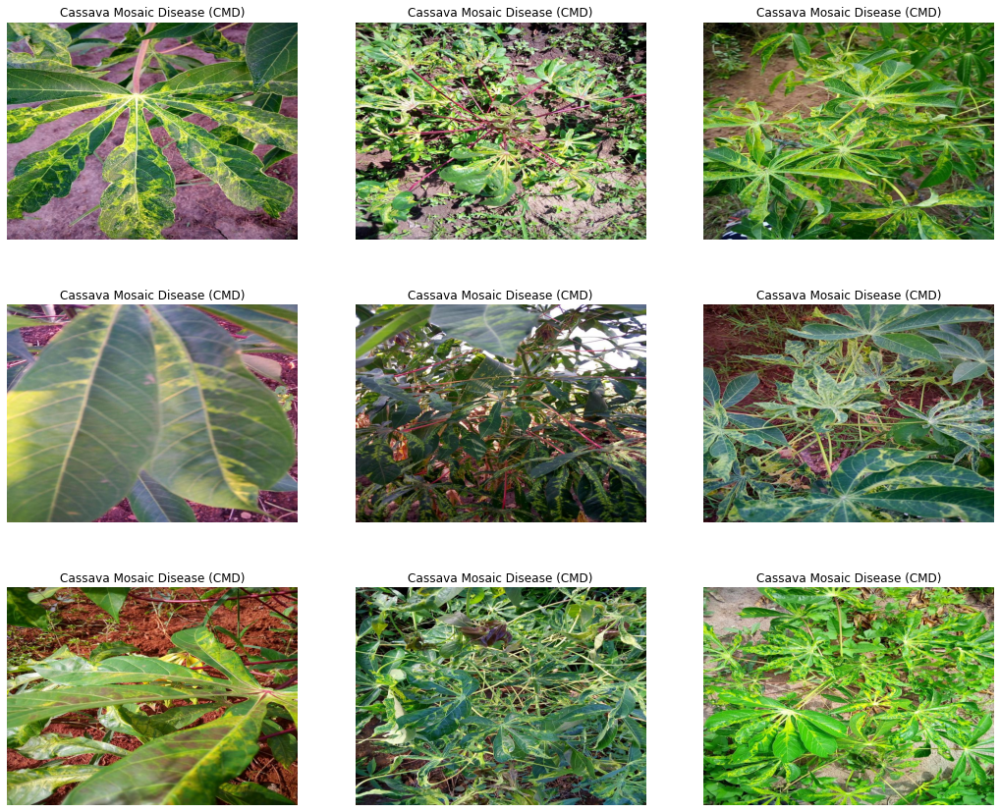

In [13]:
visualize_batch(**train_data[train_data["label"] == 3].sample(9))

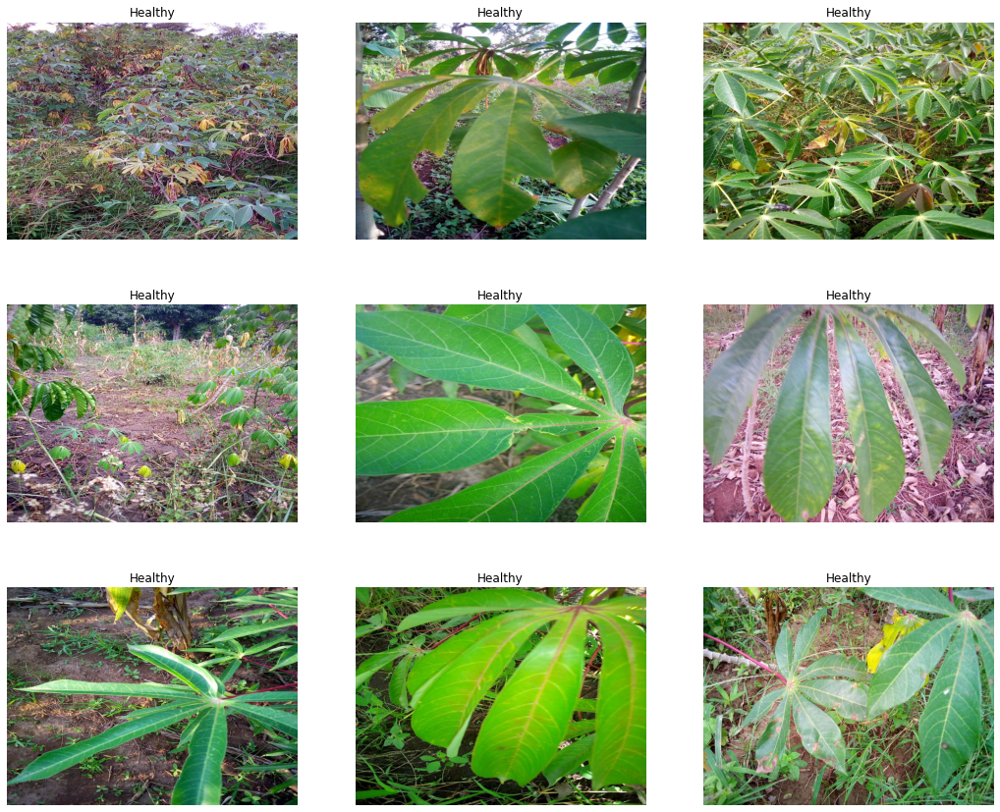

In [14]:
visualize_batch(**train_data[train_data["label"] == 4].sample(9))